In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

import nemo
import nemo.collections.asr as nemo_asr 
import numpy as np

import scipy.io.wavfile as wave

################################################################################
### WARNING, path does not exist: KALDI_ROOT=/mnt/matylda5/iveselyk/Tools/kaldi-trunk
###          (please add 'export KALDI_ROOT=<your_path>' in your $HOME/.profile)
###          (or run as: KALDI_ROOT=<your_path> python <your_script>.py)
################################################################################

/home/fjia/anaconda3/envs/vad/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
/home/fjia/anaconda3/envs/vad/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'jit' re

In [2]:
# the checkpoints are available from NGC: https://ngc.nvidia.com/catalog/models/nvidia:quartznet15x5
MODEL_YAML = '../configs/quartznet15x5.yaml'
CHECKPOINT_ENCODER = '/home/fjia/code/NeMo-fei/examples/asr/quartznet15x5/JasperEncoder-STEP-247400.pt'
CHECKPOINT_DECODER = '/home/fjia/code/NeMo-fei/examples/asr/quartznet15x5/JasperDecoderForCTC-STEP-247400.pt'

MODEL_YAML = 'configs/quartznet_vad_3x1_v1.yaml'

CHECKPOINT_ENCODER = './home/fjia/data/freesound_resampled/quartznet-3x1-v1combo_balanced_all_Mfcc/checkpoints/JasperEncoder-STEP-4465.pt'
CHECKPOINT_DECODER = './home/fjia/data/freesound_resampled/quartznet-3x1-v1combo_balanced_all_Mfcc/checkpoints/JasperDecoderForClassification-STEP-4465.pt'


In [5]:
from ruamel.yaml import YAML
yaml = YAML(typ="safe")
with open(MODEL_YAML) as f:
    model_definition = yaml.load(f)
labels = model_definition['labels']
model_definition['AudioToMelSpectrogramPreprocessor']['dither'] = 0

In [6]:
neural_factory = nemo.core.NeuralModuleFactory(
    placement=nemo.core.DeviceType.GPU,
    backend=nemo.core.Backend.PyTorch)

In [7]:
data_preprocessor = nemo_asr.AudioToMelSpectrogramPreprocessor(
    **model_definition["AudioToMelSpectrogramPreprocessor"])

jasper_encoder = nemo_asr.JasperEncoder(
    feat_in=model_definition["AudioToMelSpectrogramPreprocessor"]["features"],
    **model_definition["JasperEncoder"])

jasper_decoder = nemo_asr.JasperDecoderForCTC(
    feat_in=model_definition["JasperEncoder"]["jasper"][-1]["filters"],
    num_classes=len(labels))

greedy_decoder = nemo_asr.GreedyCTCDecoder()

[NeMo I 2020-05-05 14:53:02 features:144] PADDING: 16
[NeMo I 2020-05-05 14:53:02 features:152] STFT using conv


In [8]:
jasper_encoder.restore_from(CHECKPOINT_ENCODER)
jasper_decoder.restore_from(CHECKPOINT_DECODER)

In [9]:
wave_file ='/home/fjia/data/freesound_resampled/Baby_cry/id_66637 cryingbabymerged.wav'

sample_rate, signal = wave.read(wave_file)

# make sure that sample rate is the same as expected by Jasper
assert sample_rate == model_definition['sample_rate']

In [54]:
from nemo.backends.pytorch.nm import DataLayerNM
from nemo.core.neural_types import NeuralType, AudioSignal, LengthsType
import torch

class AudioDataLayer(DataLayerNM):
    @property
    def output_ports(self):
        return {
            'audio_signal': NeuralType(('B', 'T'), AudioSignal(freq=self._sample_rate)),
            'a_sig_length': NeuralType(tuple('B'), LengthsType()),
        }

    def __init__(self, sample_rate):
        super().__init__()
        self._sample_rate = sample_rate
        self.output = True
        
    def __iter__(self):
        return self
    
    def __next__(self):
        if not self.output:
            raise StopIteration
        self.output = False
        return torch.as_tensor(self.signal, dtype=torch.float32), \
               torch.as_tensor(self.signal_shape, dtype=torch.int64)
        
    def set_signal(self, signal):
        self.signal = np.reshape(signal.astype(np.float32)/32768., [1, -1])
        #self.signal = np.reshape(signal.astype(np.float32)/np.max(np.abs(signal)), [1, -1])
        
        self.signal_shape = np.expand_dims(self.signal.size, 0).astype(np.int64)
        self.output = True

    def __len__(self):
        return 1
    

    @property
    def dataset(self):
        return None

    @property
    def data_iterator(self):
        return self

In [62]:
a = [1,2,3]
for i in a:
    print(i)

1
2
3


In [56]:
# Instantiate necessary neural modules
data_layer = AudioDataLayer(sample_rate=model_definition['sample_rate'])

# Define inference DAG
audio_signal, audio_signal_len = data_layer()
processed_signal, processed_signal_len = data_preprocessor(
    input_signal=audio_signal,
    length=audio_signal_len)
encoded, encoded_len = jasper_encoder(audio_signal=processed_signal,
                                      length=processed_signal_len)
log_probs = jasper_decoder(encoder_output=encoded)
predictions = greedy_decoder(log_probs=log_probs)

In [47]:
log_probs

In [57]:
data_layer.set_signal(signal)
tensors = neural_factory.infer([
    audio_signal,
    processed_signal,
    encoded,
    log_probs,
    predictions,
])
audio = tensors[0][0][0].cpu().numpy()
features = tensors[1][0][0].cpu().numpy()
encoded_features = tensors[2][0][0].cpu().numpy(),
probs = tensors[3][0][0].cpu().numpy()
preds = tensors[4][0]

[NeMo I 2020-05-05 15:23:02 actions:734] Evaluating batch 0 out of 10


In [36]:
audio.shape

(6207999,)

In [59]:
audio.shape

(6207999,)

In [60]:
probs.shape

(19400, 29)

In [35]:
probs.shape

(19400, 29)

In [61]:
features.shape

(64, 38800)

In [15]:
features.shape

(64, 38800)

In [42]:
encoded_features

(array([[0.27316287, 0.2795226 , 0.21653351, ..., 0.        , 0.        ,
         0.        ],
        [0.7248987 , 0.7211204 , 0.70107156, ..., 0.32689133, 0.        ,
         0.        ],
        [0.18925098, 0.19756167, 0.09001896, ..., 0.        , 0.0332682 ,
         0.1761058 ],
        ...,
        [0.        , 0.        , 0.01260406, ..., 0.10051171, 0.        ,
         0.        ],
        [0.32359567, 0.3272653 , 0.2741767 , ..., 0.5397488 , 0.43526953,
         0.86702424],
        [0.2818682 , 0.28055677, 0.24494566, ..., 0.16373007, 0.35259295,
         0.        ]], dtype=float32),)

In [16]:
probs

array([[-1.8214361e+01, -1.5374567e+01, -1.5974409e+01, ...,
        -1.8263330e+01, -1.6049067e+01, -1.9073486e-06],
       [-1.8072182e+01, -1.5076856e+01, -1.5823385e+01, ...,
        -1.8035208e+01, -1.5881672e+01, -3.8146973e-06],
       [-1.8780678e+01, -1.5913306e+01, -1.6254805e+01, ...,
        -1.8557920e+01, -1.6430044e+01, -1.9073486e-06],
       ...,
       [-2.4699003e+01, -2.6679630e+01, -2.5950649e+01, ...,
        -2.7919767e+01, -2.5644650e+01,  0.0000000e+00],
       [-2.2974924e+01, -2.3436337e+01, -2.3627792e+01, ...,
        -2.6148212e+01, -2.3758608e+01,  0.0000000e+00],
       [-2.3408102e+01, -2.5450245e+01, -2.5450544e+01, ...,
        -2.7176891e+01, -2.5061533e+01,  0.0000000e+00]], dtype=float32)

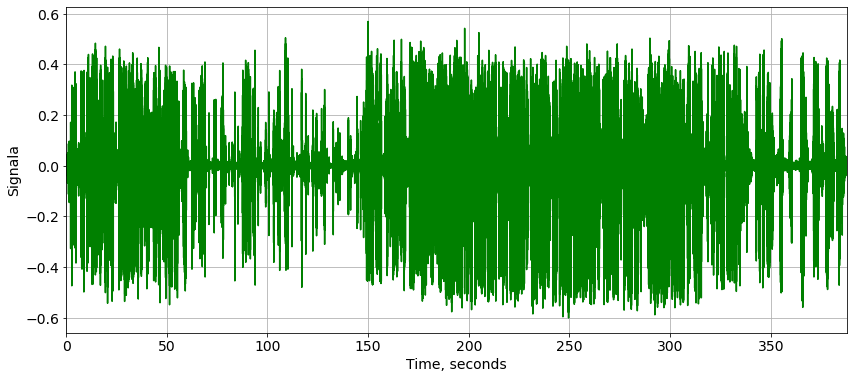

In [17]:
plt.figure(figsize=[14,6])
plt.rcParams.update({'font.size': 14, 'font.family': 'sans-serif'})
plt.plot(np.arange(audio.size)/sample_rate, audio, 'g')
plt.xlim([0, audio.size/sample_rate])
plt.ylabel('Signala')
plt.xlabel('Time, seconds')
plt.grid()

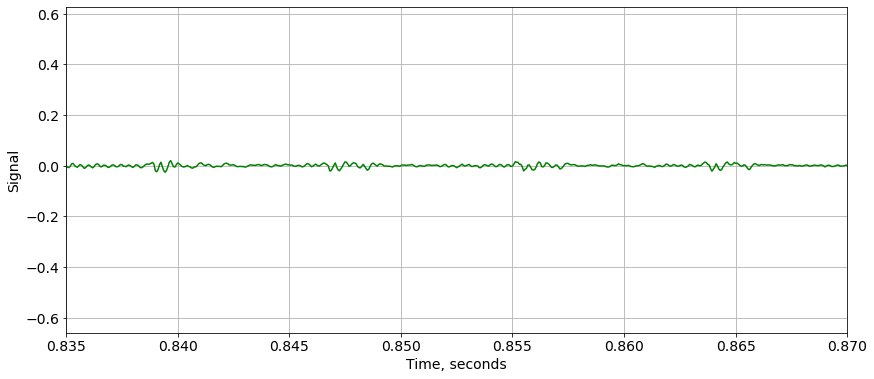

In [18]:
plt.figure(figsize=[14,6])
plt.plot(np.arange(audio.size)/sample_rate, audio, 'g')
plt.xlim([0.835, 0.87])
plt.ylabel('Signal')
plt.xlabel('Time, seconds')
plt.grid()

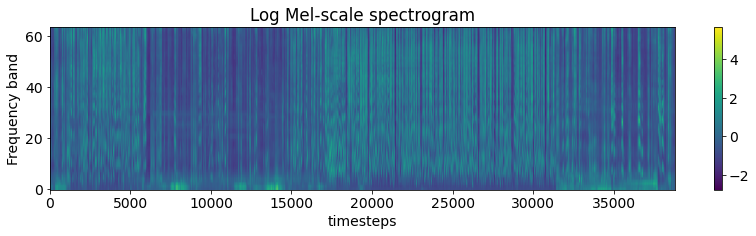

In [19]:
plt.figure(figsize=[14,3])
plt.imshow(features)
plt.axis('tight')
plt.ylabel('Frequency band')
plt.xlabel('timesteps')
plt.colorbar()
plt.title('Log Mel-scale spectrogram')
plt.gca().invert_yaxis()

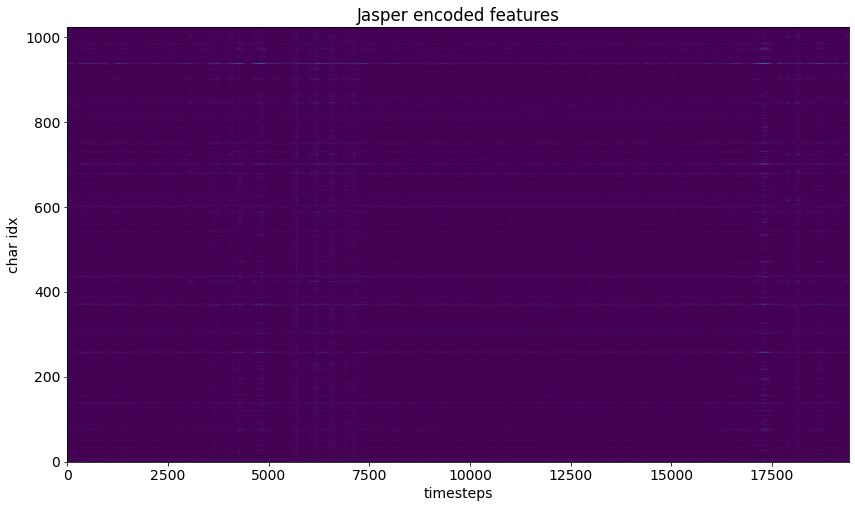

In [20]:
plt.figure(figsize=[14,8])
plt.imshow(encoded_features[0])
plt.axis('tight')
plt.ylabel('char idx')
plt.xlabel('timesteps')
plt.title('Jasper encoded features')
plt.gca().invert_yaxis()

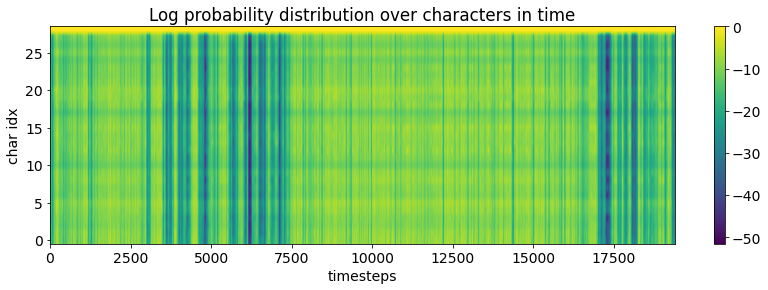

In [21]:
plt.figure(figsize=[14,4])
plt.imshow(probs.transpose())
plt.axis('tight')
plt.ylabel('char idx')
plt.xlabel('timesteps')
plt.colorbar()
plt.title('Log probability distribution over characters in time')
plt.gca().invert_yaxis()

In [29]:
import IPython.display as ipd
ipd.Audio(audio, rate=sample_rate)

In [38]:
from nemo.collections.asr.helpers import post_process_predictions
post_process_predictions([preds], labels)

["e anne fo e  towaeo areport aosicoe tae co for din'tkn now ohoh a owo ainoh what whato aonolata ho "]

In [37]:
from nemo.collections.asr.helpers import __ctc_decoder_predictions_tensor
__ctc_decoder_predictions_tensor([preds], labels)

AttributeError: 'list' object has no attribute 'long'